# Generation of images through a Generative Adversarial Network (GAN) using the CelebA dataset

Generative Adversarial Networks (GAN) are a type of neural networks formed by two different neural networks: the generator and the discriminator, trained together. The generator tries to produce candidates with a certain data distribution of interest, while the discriminator tries to distinguish between the candidates produced by the generator from the true data, giving back feedbacks to the generator. The final target of the GAN is to train the generator such that it becomes able to 'fool' the discriminator, and produce candidates whose distribution is undistinguishable from the true data.

In this notebook, I have used a GAN to generate images that look like those of the celebA dataset, containing more than 200,000 pictures of face images of various celebrities.

Training a GAN is always a very difficult exercise, since it requires to find an "equilibrium" between the generator and the discriminator (both are updated dynamically in the training process). In fact, two common situations occur:
* The generator fails to create realistic images - this may occur when the generator fails to converge, or if the discriminator is too good, it doesn't provide enough information to the generator to make progress (vanishing gradient)
* Mode collapse - the generator becomes too strong and "learn" how to produce one single output that "fools" the discriminator. In that case, the generator will just produce only that particular output over and over again, without improving any further.

Let's now train our GAN.

In [1]:
import os
import cv2
from PIL import Image
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from numpy.random import randint
from matplotlib.image import imread
%matplotlib inline

We will just usre 100,000 pictures (half dataset), it will be enough to train the GAN. We also resize them to lower resolution (48x48) to save computational time.

In [2]:
path_images_temp = []
folder_images= "/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/"

for path in os.listdir(folder_images):
    if '.jpg' in path:
        path_images_temp.append(os.path.join(folder_images, path))
        
path_images = []
path_images = path_images_temp[0:100000]

In [3]:
image_shape = (48,48,3)

X_train = [np.array((Image.open(path).resize(image_shape[:-1]))) for path in path_images]

In [4]:
len(X_train)

100000

## Image visualization

Visualization of the first 100 pictures:

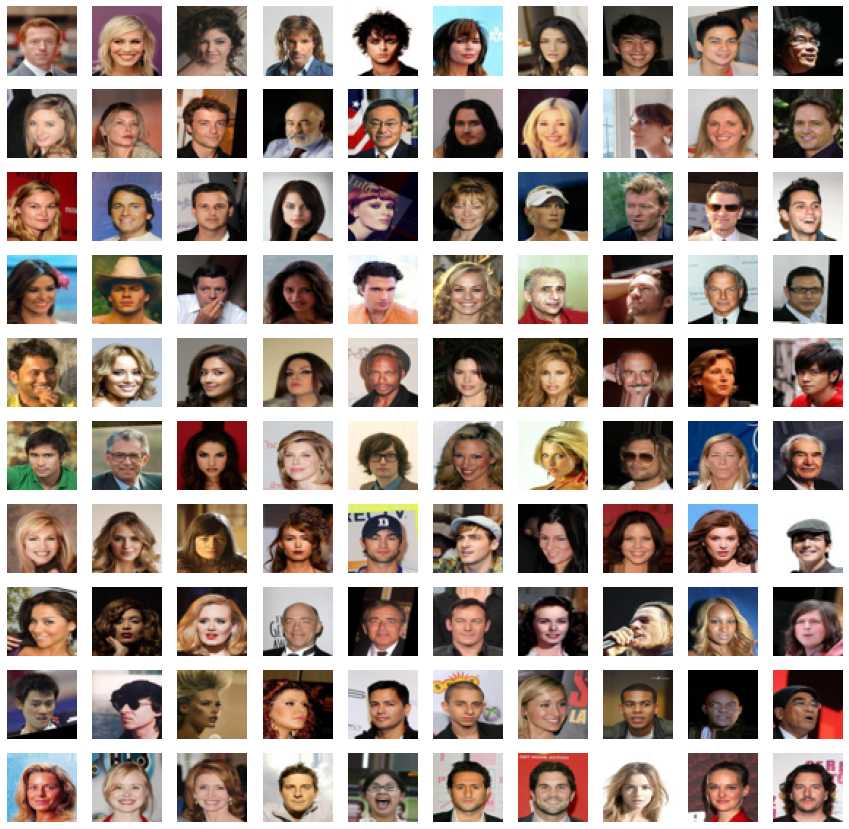

In [5]:
plt.figure(figsize=(15, 15))

for i in range(100):
    plt.subplot(10, 10, 1 + i)
    plt.axis('off')
    plt.imshow(X_train[i])

plt.show()

In [6]:
np.max(X_train[1])

250

#### Images need to be rescaled between -1 and 1, since the activation function used in the last generator will be the hyperbolic tangent (whose output is between -1 and 1):

In [7]:
X_train = np.array(X_train)
X_train = (X_train - 127.5) / 127.5

In [8]:
np.max(X_train[1])

0.9607843137254902

In [9]:
X_train.shape

(100000, 48, 48, 3)

### Now we create our model

In [10]:
import tensorflow as tf
from tensorflow.keras.layers import Dense,Reshape,Dropout,LeakyReLU,Flatten,Conv2D,Conv2DTranspose
from tensorflow.keras.models import Sequential

In [11]:
np.random.seed(42)
tf.random.set_seed(42)

codings_size = 100

## Discriminator

The discriminator consists of 4 convolutional layers that will downsample the image from 48x48 to 6x6. The learning rate chosen is 0.0002, which is an optimal value for training a GAN. Other values have been tested, but they give worse results.

In [12]:
from keras.initializers import RandomNormal

discriminator = Sequential()

discriminator.add(Conv2D(64, (3,3),  padding='same', input_shape=image_shape))
discriminator.add(LeakyReLU(alpha=0.2))

discriminator.add(Conv2D(128, (3,3), strides=(2,2), padding='same'))
discriminator.add(LeakyReLU(alpha=0.2))

discriminator.add(Conv2D(128, (3,3), strides=(2,2), padding='same'))
discriminator.add(LeakyReLU(alpha=0.2))

discriminator.add(Conv2D(256, (3,3), strides=(2,2), padding='same'))
discriminator.add(LeakyReLU(alpha=0.2))

discriminator.add(Flatten())
discriminator.add(Dropout(0.4))
discriminator.add(Dense(1, activation='sigmoid'))

opt = tf.keras.optimizers.Adam(lr=0.0002, beta_1=0.5)
discriminator.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])
discriminator.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 48, 48, 64)        1792      
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 48, 48, 64)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 24, 24, 128)       73856     
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 24, 24, 128)       0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 12, 12, 128)       147584    
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 12, 12, 128)       0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 6, 6, 256)         2

## Generator

The generator consists of 4 transpose convolutional layers, acting in the opposite direction of normal convolutional layers (upsampling the images from 6x6 to 48x48). The activation function of the convolutional layers is the LeakyReLu, normally recommended for GANs, while the activation function of the output layer is the hyperbolic tangent.

In [13]:
generator = Sequential()

n_nodes = 256 * 6 * 6
generator.add(Dense(n_nodes, input_dim=codings_size))
generator.add(LeakyReLU(alpha=0.2))
generator.add(Reshape((6, 6, 256)))

generator.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
generator.add(LeakyReLU(alpha=0.2))

generator.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
generator.add(LeakyReLU(alpha=0.2))

generator.add(Conv2DTranspose(128, (4,4), strides=(2,2), padding='same'))
generator.add(LeakyReLU(alpha=0.2))

generator.add(Conv2D(3, (3,3), activation='tanh', padding='same'))
generator.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 9216)              930816    
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (None, 9216)              0         
_________________________________________________________________
reshape (Reshape)            (None, 6, 6, 256)         0         
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 12, 12, 128)       524416    
_________________________________________________________________
leaky_re_lu_5 (LeakyReLU)    (None, 12, 12, 128)       0         
_________________________________________________________________
conv2d_transpose_1 (Conv2DTr (None, 24, 24, 128)       262272    
_________________________________________________________________
leaky_re_lu_6 (LeakyReLU)    (None, 24, 24, 128)      

### Now we define the GAN, including both the discriminator and the generator:

In [14]:
GAN = Sequential([generator, discriminator])

In [15]:
#discriminator.compile(loss="binary_crossentropy", optimizer="adam")
discriminator.trainable = False

The optimizer choosen is adam with a learning rate of 0.0002, optimized in order to avoid convergence failure of the GAN.

In [16]:
opt = tf.keras.optimizers.Adam(lr=0.0002, beta_1=0.5)
GAN.compile(loss="binary_crossentropy", optimizer=opt)

In [17]:
GAN.layers

In [18]:
GAN.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
sequential_1 (Sequential)    (None, 48, 48, 3)         1983235   
_________________________________________________________________
sequential (Sequential)      (None, 1)                 527617    
Total params: 2,510,852
Trainable params: 1,983,235
Non-trainable params: 527,617
_________________________________________________________________


In [20]:
epochs = 30
batch_size = 128

The following function will be used to save images generated by the GAN at every epoch: 

In [21]:
def save_images(model,epoch,test_input):
    predictions = model(test_input, training=False)
    fig = plt.figure(figsize=(15,15))

    for i in range(100):
        plt.subplot(10, 10, 1 + i)
        plt.axis('off')
        plt.imshow(predictions[i])
        
    plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
    plt.close('all')

### We train the network for 30 epochs, which is already fine to obtain meaningful results.

In [22]:
noise_for_gif = tf.random.normal(shape=[100, codings_size])

bat_per_epoch = int(X_train.shape[0] / batch_size)

generator, discriminator = GAN.layers
d_acc_f_hist, d_acc_r_hist, d_loss_f_hist, d_loss_r_hist, g_loss_hist = list(), list(), list(), list(), list()

for epoch in range(epochs):
    if epoch%1 == 0:
        print(f"Epoch: {epoch+1}/{epochs}")
#    print(f"\tCurrently on epoch: {epoch+1}")
    i = 0
    d_acc_f_temp = 0
    d_acc_r_temp = 0
    d_loss_f_temp = 0
    d_loss_r_temp = 0
    g_loss_temp = 0
    # For every batch:
    for j in range(bat_per_epoch):
#    for X_batch in dataset:
        i=i+1
 #       if i%20 == 0:
 #           print(f"\tCurrently on epoch: {epoch}, batch number {i} of {len(X_train)//batch_size}")
        #####################################
        ## TRAINING THE DISCRIMINATOR #######
        #####################################
        
        # Use the generator to create fake images based on noise input
        noise = tf.random.normal(shape=[batch_size, codings_size])
        fake_images = generator(noise)        
        
        #Train discriminator on fake images
        y0 = np.zeros((batch_size,1))
        d_loss_f, d_acc_f = discriminator.train_on_batch(fake_images,y0)
        d_loss_f_temp += d_loss_f
        d_acc_f_temp += d_acc_f
 
        #retrieve real images
        ix = randint(0, X_train.shape[0], batch_size)
        X_batch = X_train[ix]

        #Train discriminator on real images
        y1 = np.ones((batch_size,1))
 #       y1 = y1 - 0.1 #label smoothing
#        y1 = y1 - 0.3 + np.random.random(y1.shape) * 0.3 #label smoothing
        d_loss_r, d_acc_r = discriminator.train_on_batch(X_batch,y1)
        d_loss_r_temp += d_loss_r
        d_acc_r_temp += d_acc_r
        
   #     print(f"Discriminator accuracy - real: {d_acc_r}, fake: {d_acc_f}")
        
        ######################################
        ## TRAINING THE GENERATOR     #####
        ######################################
        
        # Create some noise
        noise = tf.random.normal(shape=[batch_size, codings_size])
        
        # We want discriminator to believe that fake images are real
        y2 = np.ones((batch_size,1))
        
        # Avois a warning
#        discriminator.trainable = False
        
        g_loss = GAN.train_on_batch(noise, y2)
        g_loss_temp += g_loss
#        print(f"Generator accuracy: {g_loss}")        
        
    d_loss_f_hist.append(d_loss_f_temp/i)
    d_acc_f_hist.append(d_acc_f_temp/i)
    d_loss_r_hist.append(d_loss_r_temp/i)
    d_acc_r_hist.append(d_acc_r_temp/i)
    g_loss_hist.append(g_loss_temp/i)

    if epoch%1 == 0:
        save_images(generator,epoch,noise_for_gif)
    
print("TRAINING COMPLETE")            

Epoch: 1/30
Epoch: 2/30
Epoch: 3/30
Epoch: 4/30
Epoch: 5/30
Epoch: 6/30
Epoch: 7/30
Epoch: 8/30
Epoch: 9/30
Epoch: 10/30
Epoch: 11/30
Epoch: 12/30
Epoch: 13/30
Epoch: 14/30
Epoch: 15/30
Epoch: 16/30
Epoch: 17/30
Epoch: 18/30
Epoch: 19/30
Epoch: 20/30
Epoch: 21/30
Epoch: 22/30
Epoch: 23/30
Epoch: 24/30
Epoch: 25/30
Epoch: 26/30
Epoch: 27/30
Epoch: 28/30
Epoch: 29/30
Epoch: 30/30
TRAINING COMPLETE


### Plots of discriminator/generator loss and discriminator accuracy

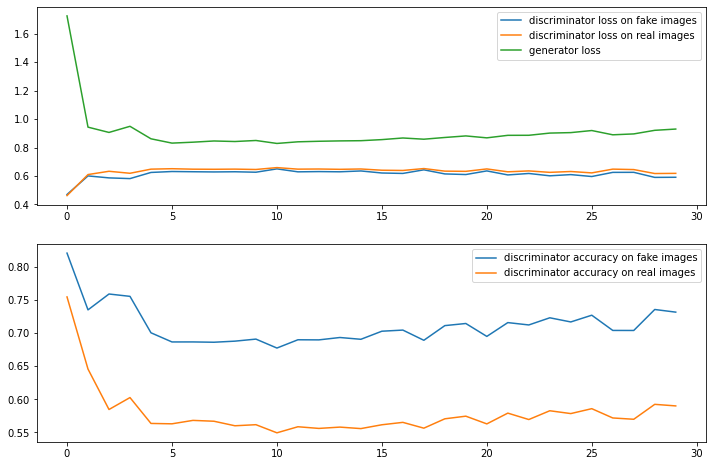

In [23]:
plt.figure(figsize=(12,8))

plt.subplot(2, 1, 1)
plt.plot(d_loss_f_hist, label='discriminator loss on fake images')
plt.plot(d_loss_r_hist, label='discriminator loss on real images')
plt.plot(g_loss_hist, label='generator loss')
plt.legend()

plt.subplot(2, 1, 2)
plt.plot(d_acc_f_hist, label='discriminator accuracy on fake images')
plt.plot(d_acc_r_hist, label='discriminator accuracy on real images')
plt.legend()

#plt.savefig('results_baseline/plot_line_plot_loss.png')
#plt.close()

#### From the plots, it seems the GAN already stabilizes after a few epochs.

### Plots

It's time to see the results. We now use the generator to produce face images starting from a random noise distribution:

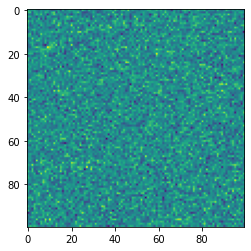

In [24]:
#noise = tf.random.normal(shape=[100, codings_size])
plt.imshow(noise_for_gif)

0.93167156


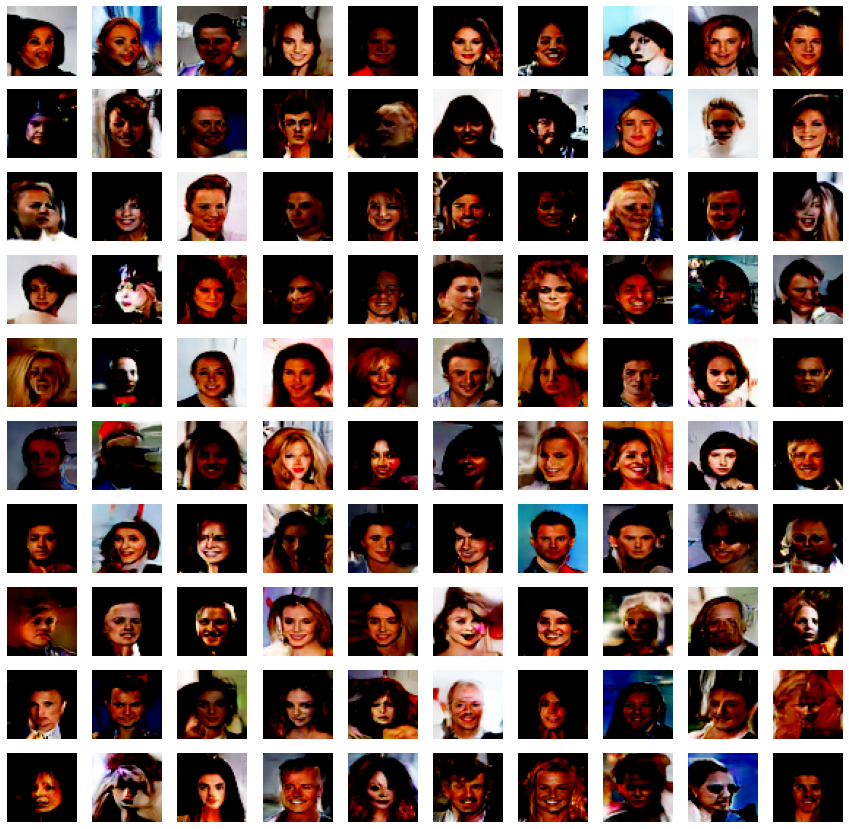

In [25]:
images = generator(noise_for_gif)
plt.figure(figsize=(15, 15))

#images = (images * 127.5) + 127.5

print(np.max(images[0]))

for i in range(100):
    plt.subplot(10, 10, 1 + i)
    plt.axis('off')
    plt.imshow(images[i])

plt.show()

The results are not so bad, although some pictures are clearly not perfect.

We can also have a look at how the generator improved during the epochs, by looking at how these 100 pictures evolved during the iterations:

In [26]:
!pip install -q imageio
!pip install -q git+https://github.com/tensorflow/docs


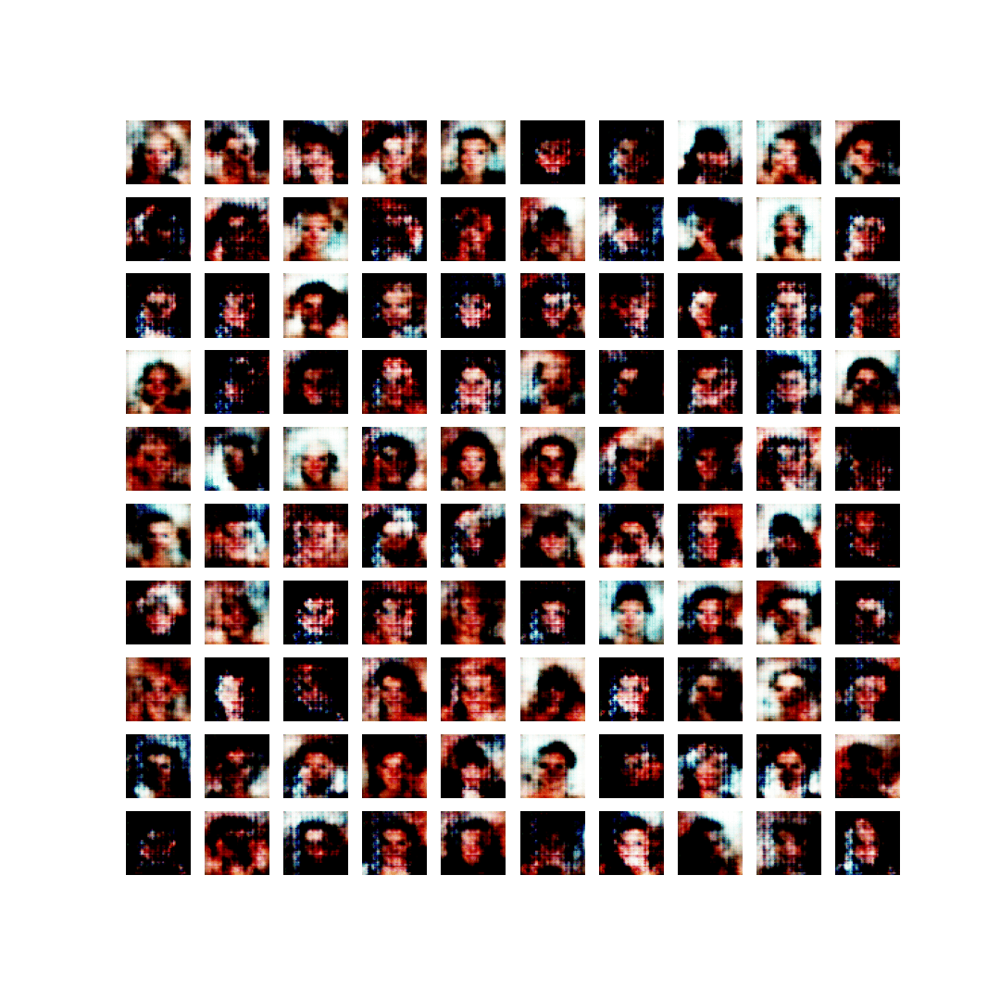

In [27]:
import imageio
import glob

anim_file = 'dcgan.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
    filenames = glob.glob('image*.png')
    filenames = sorted(filenames)
    for filename in filenames:
        image = imageio.imread(filename)
        writer.append_data(image)
    image = imageio.imread(filename)
    writer.append_data(image)
    
import tensorflow_docs.vis.embed as embed
embed.embed_file(anim_file)

In [28]:
generator.save('generator.h5')